In [2]:
#what is transfer learning?

#surely someone has spent the time creating the right model for the job...

#theres a very popular computer vision dataset called image net, so this is used as a benchmark around a lot of computer vision models

#we can use thier existing architecture and apply it to our 10 food classes

#amazing results in far less time, can also be used in natural language processing

#the model learns the patterns from a similar problem space

In [3]:
#transfer learning with tensorflow part one : feature extraction

In [4]:
!nvidia-smi #tesla T4 GPU

Tue Mar 18 15:02:38 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   44C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [5]:
import zipfile

!wget https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_10_percent.zip

zip_ref = zipfile.ZipFile("10_food_classes_10_percent.zip")

zip_ref.extractall()
zip_ref.close()

--2025-03-18 15:02:38--  https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_10_percent.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 64.233.170.207, 142.251.175.207, 74.125.24.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|64.233.170.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 168546183 (161M) [application/zip]
Saving to: ‘10_food_classes_10_percent.zip’

10_food_classes_10_ 100%[===================>] 160.74M  21.5MB/s    in 8.9s    

2025-03-18 15:02:48 (18.1 MB/s) - ‘10_food_classes_10_percent.zip’ saved [168546183/168546183]



In [6]:
import os

for dirpath, dirnames, filenames in os.walk("10_food_classes_10_percent"):
  print(f"There are {len(dirnames)} directories and {len(filenames)} images in {dirpath}")

There are 2 directories and 0 images in 10_food_classes_10_percent
There are 10 directories and 0 images in 10_food_classes_10_percent/train
There are 0 directories and 75 images in 10_food_classes_10_percent/train/ice_cream
There are 0 directories and 75 images in 10_food_classes_10_percent/train/steak
There are 0 directories and 75 images in 10_food_classes_10_percent/train/grilled_salmon
There are 0 directories and 75 images in 10_food_classes_10_percent/train/ramen
There are 0 directories and 75 images in 10_food_classes_10_percent/train/hamburger
There are 0 directories and 75 images in 10_food_classes_10_percent/train/pizza
There are 0 directories and 75 images in 10_food_classes_10_percent/train/chicken_wings
There are 0 directories and 75 images in 10_food_classes_10_percent/train/chicken_curry
There are 0 directories and 75 images in 10_food_classes_10_percent/train/fried_rice
There are 0 directories and 75 images in 10_food_classes_10_percent/train/sushi
There are 10 director

In [25]:
#only 10 percent of the training data that we had before,

#creating data loaders (preparing the data)

#we'll use the imagedatagenerator class to turn our images into batches#v

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import preprocess_input

IMAGE_SHAPE = (224, 224)
BATCH_SIZE = 32

train_dir = "10_food_classes_10_percent/train/"
test_dir = "10_food_classes_10_percent/test/"

train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

print("Training Images")
train_data_10_percent = train_datagen.flow_from_directory(directory = train_dir,
                                                          target_size = IMAGE_SHAPE,
                                                          batch_size = BATCH_SIZE,
                                                          class_mode = "categorical")

print("Testing Images")
test_data = test_datagen.flow_from_directory(directory = test_dir,
                                             target_size = IMAGE_SHAPE,
                                             batch_size = BATCH_SIZE,
                                             class_mode = "categorical")

Training Images
Found 750 images belonging to 10 classes.
Testing Images
Found 2500 images belonging to 10 classes.


In [8]:
import pathlib
import numpy as np

data_dir = pathlib.Path(train_dir)

In [9]:
class_names = np.array(sorted([item.name for item in data_dir.glob("*")]))
print(class_names)

['chicken_curry' 'chicken_wings' 'fried_rice' 'grilled_salmon' 'hamburger'
 'ice_cream' 'pizza' 'ramen' 'steak' 'sushi']


In [10]:
import random
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

def view_random_image(target_dir, target_class = random.choice(class_names)):
  target_folder = target_dir+target_class

  random_image = random.sample(os.listdir(target_folder), 1)

  img = mpimg.imread(target_folder + "/" + random_image[0])

  plt.imshow(img)
  plt.axis("off")
  plt.title(target_class)

  print(f"image shape: {img.shape}")
  return img


image shape: (512, 512, 3)


array([[[ 53,  42,  22],
        [ 46,  35,  15],
        [ 47,  34,  17],
        ...,
        [169, 158, 138],
        [167, 152, 131],
        [164, 149, 128]],

       [[ 54,  43,  23],
        [ 54,  43,  23],
        [ 50,  37,  20],
        ...,
        [193, 181, 159],
        [187, 172, 151],
        [182, 167, 146]],

       [[ 53,  42,  22],
        [ 62,  51,  31],
        [ 54,  41,  24],
        ...,
        [196, 181, 160],
        [187, 172, 151],
        [182, 166, 143]],

       ...,

       [[166, 122,  77],
        [168, 124,  79],
        [168, 124,  79],
        ...,
        [ 97,  79,  57],
        [102,  84,  62],
        [106,  88,  66]],

       [[156, 118,  73],
        [161, 123,  78],
        [164, 126,  81],
        ...,
        [109,  91,  69],
        [119, 101,  81],
        [126, 109,  89]],

       [[146, 109,  65],
        [153, 116,  72],
        [158, 121,  77],
        ...,
        [124, 106,  84],
        [138, 121, 101],
        [150, 133, 113]]], dtype=uint8)
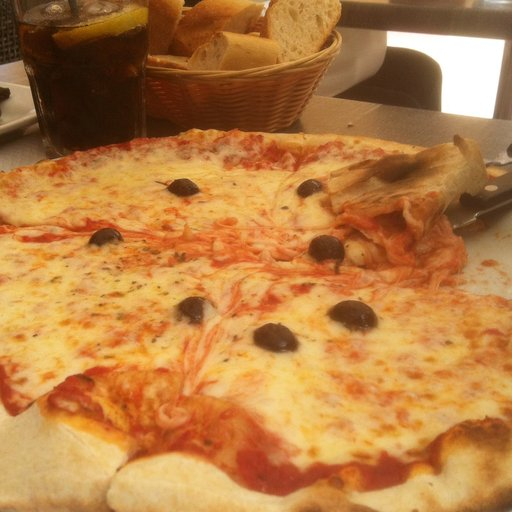

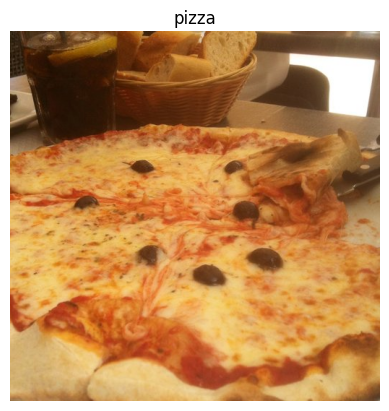

In [11]:
view_random_image(train_dir)

In [12]:
##setting up callbacks (things to run whilst our model trains)

#callbacks are extra functionality you can add to your models to be performed during or after training
#some of the most popular callbacks

#tracking experiments with tensorboard callback, int he past we've done this with history.history
#model check point

#create tensorboard callback (functionized because we need to create a new one for each model)

import datetime

def create_tensorboard_callback(dir_name, experiment_name):
  log_dir = dir_name + "/" + experiment_name + "/" +datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
  tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
  print(f"Saving TensorBoard log files to: {log_dir}")
  return tensorboard_callback

In [13]:
from tensorflow import keras
resnet_model = keras.applications.ResNet50V2(
    include_top=False,
    weights="imagenet",
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classifier_activation="softmax",
    name="resnet50v2",
)

94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


In [14]:
from tensorflow.keras.utils import plot_model

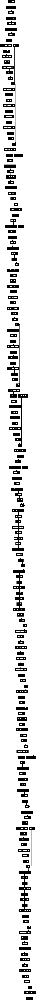

In [15]:
plot_model(resnet_model) #so its an insane model

In [16]:
resnet_model.summary()

Model: "resnet50v2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, None, None, 3)  │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, None, None, 3)  │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, None, None, 64) │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, None, None, 64) │              0 │ conv1_conv[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, None, None, 64) │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_preact_bn    │ (None, None, None, 64) │            256 │ pool1_pool[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_preact_relu  │ (None, None, None, 64) │              0 │ conv2_block1_preact_b… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, None, None, 64) │          4,096 │ conv2_block1_preact_r… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, None, None, 64) │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, None, None, 64) │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_pad        │ (None, None, None, 64) │              0 │ conv2_block1_1_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, None, None, 64) │         36,864 │ conv2_block1_2_pad[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, None, None, 64) │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, None, None, 64) │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, None, None,     │         16,640 │ conv2_block1_preact_r… │
│ (Conv2D)             

 Total params: 23,564,800 (89.89 MB)

 Trainable params: 23,519,360 (89.72 MB)

 Non-trainable params: 45,440 (177.50 KB)

In [26]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50

# Load ResNet50 without its classification head (top)
resnet_model = ResNet50(
    include_top=False, #what we made here is a resnet feature extractor
    weights='imagenet',
    input_shape=(224, 224, 3) #can give the input shape here, dont need activation as softmax just yet or to tell the classes because top is set to false
)

resnet_model.trainable = False  # Freeze the base model, means all the pattens trained on imagenet remian the same

# Create a Sequential model by stacking layers
model = tf.keras.Sequential([
    resnet_model,
    tf.keras.layers.GlobalAveragePooling2D(), #i think its possible to add this pooling layer to the resnet model
    tf.keras.layers.Dense(10, activation='softmax')
])

# Build the model (optional, but useful for printing summary)
model.build([None, 224, 224, 3])
model.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)                │ (None, 7, 7, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │          20,490 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,608,202 (90.06 MB)

 Trainable params: 20,490 (80.04 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [27]:
#it returns it uncompiled so we need to compile our model

model.compile(
    loss = tf.keras.losses.categorical_crossentropy,
    optimizer = tf.keras.optimizers.Adam(),
    metrics = ["accuracy"]
)

In [28]:
#lets fit out resnet model to the data (10 percent of 10 classes)

resnet_history = model.fit(train_data_10_percent, epochs = 5, steps_per_epoch = len(train_data_10_percent),
                                  validation_data = test_data,
                                  callbacks = [create_tensorboard_callback(dir_name = "tensorflow_hub",
                                                                           experiment_name="resnet50V2")])

Saving TensorBoard log files to: tensorflow_hub/resnet50V2/20250318-151055


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 28s 820ms/step - accuracy: 0.2757 - loss: 2.1100 - val_accuracy: 0.6492 - val_loss: 1.0934
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 31s 494ms/step - accuracy: 0.6997 - loss: 0.9247 - val_accuracy: 0.7484 - val_loss: 0.7857
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 12s 522ms/step - accuracy: 0.8382 - loss: 0.5803 - val_accuracy: 0.7808 - val_loss: 0.6866
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 21s 539ms/step - accuracy: 0.8969 - loss: 0.4256 - val_accuracy: 0.7772 - val_loss: 0.6740
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 19s 478ms/step - accuracy: 0.9176 - loss: 0.3558 - val_accuracy: 0.7980 - val_loss: 0.6269


In [ ]:
#this is only using 10 percent of the data available

#our transfer learning feature extractor model out performed all of the previous models we built by hand and in a quicker training time and with only 10 percent of the training examples

In [32]:
#can put a script like this into a helper.py script, upload it to github and upload it when you need it
#like from helper import plot_loss_curves

#lets create a function to plot our loss curves
def plot_loss_curves(history):
  import matplotlib.pyplot as plt
  import pandas as pd

  plt.figure(figsize = (5, 5))
  pd.DataFrame(resnet_history.history)[["loss", "val_loss"]].plot()
  plt.title("accuracy vs val_accuracy")
  plt.xlabel("epochs")

  plt.figure(figsize = (5, 5))
  pd.DataFrame(resnet_history.history)[["accuracy", "val_accuracy"]].plot()

<Figure size 500x500 with 0 Axes>

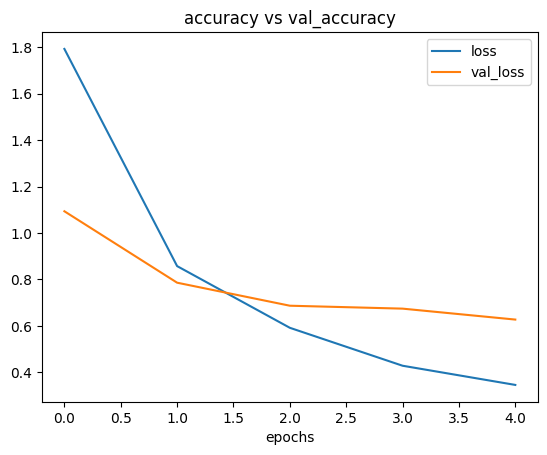

<Figure size 500x500 with 0 Axes>

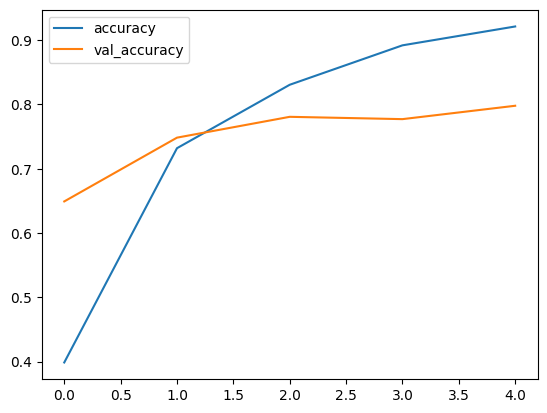

In [33]:
plot_loss_curves(resnet_history)

In [ ]:
#looks like it might be starting to overfit slightly but not terribly, because training loss is continuing to decrease while valid loss is plateauing
#our model is going good

creating and testing efficinetnet b0, what would we have to change

In [43]:
#recreating the training and test data to be prepared for efficient net

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.efficientnet import preprocess_input as efficient_preprocess

train_datagen = ImageDataGenerator(preprocessing_function=efficient_preprocess)
test_datagen = ImageDataGenerator(preprocessing_function=efficient_preprocess)

train_data_10_percent_efficient = train_datagen.flow_from_directory(
    directory = train_dir,
    target_size = IMAGE_SHAPE,
    batch_size = BATCH_SIZE,
    class_mode = 'categorical'
)

test_data = test_datagen.flow_from_directory(directory = test_dir,
                                             target_size = IMAGE_SHAPE,
                                             batch_size = BATCH_SIZE,
                                             class_mode = "categorical")

Found 750 images belonging to 10 classes.
Found 2500 images belonging to 10 classes.


In [44]:
efficientnetb0 = keras.applications.EfficientNetB0(
    include_top=False,
    weights="imagenet",
    input_shape = (224, 224, 3),
    name="efficientnetb0",
)

efficientnetb0.trainable = False

model_2 = tf.keras.Sequential([
    efficientnetb0,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(10, activation = "softmax")
])

model_2.build([None, 224, 224, 3])
model_2.summary() #theres less trainable parameters hence the word efficient I suppose

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)          │ (None, 7, 7, 1280)          │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_2           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 10)                  │          12,810 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,062,381 (15.50 MB)

 Trainable params: 12,810 (50.04 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [48]:
train_data_10_percent_efficient[1][1] #this is the first batch of training labels, here we can see that the data
#is one hot encoded so the loss function would be categorical_crossentropy

array([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 

In [50]:
model_2.compile(
    loss = "categorical_crossentropy",
    optimizer = tf.keras.optimizers.Adam(),
    metrics = ["accuracy"]
)

efficientnet_history = model_2.fit(train_data_10_percent_efficient, epochs = 5,
                                   steps_per_epoch=len(train_data_10_percent_efficient),
                                   validation_data = test_data, validation_steps = len(test_data),
                                   callbacks = [create_tensorboard_callback(dir_name = "tensorflow_hub",
                                                                            experiment_name = "efficientnet")])

Saving TensorBoard log files to: tensorflow_hub/efficientnet/20250318-154938


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 51s 1s/step - accuracy: 0.3153 - loss: 2.0346 - val_accuracy: 0.7228 - val_loss: 1.2683
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 9s 384ms/step - accuracy: 0.7294 - loss: 1.1764 - val_accuracy: 0.8164 - val_loss: 0.8627
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 9s 391ms/step - accuracy: 0.8180 - loss: 0.8291 - val_accuracy: 0.8420 - val_loss: 0.6978
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 10s 367ms/step - accuracy: 0.8363 - loss: 0.6721 - val_accuracy: 0.8552 - val_loss: 0.6131
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 11s 379ms/step - accuracy: 0.8847 - loss: 0.5488 - val_accuracy: 0.8600 - val_loss: 0.5560


<Figure size 500x500 with 0 Axes>

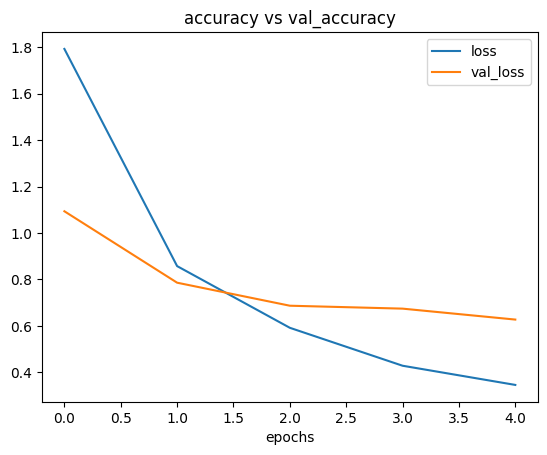

<Figure size 500x500 with 0 Axes>

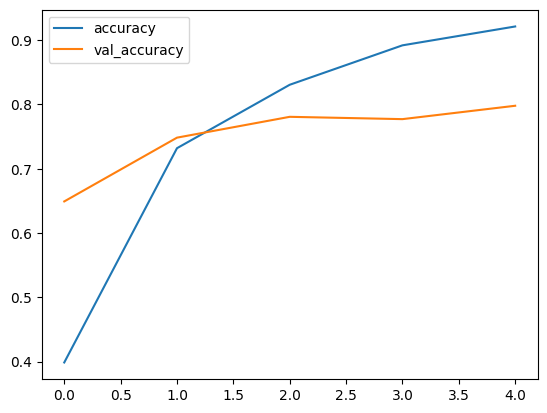

In [51]:
#wow this efficientnet model is even more powerful than the resnet model on our data

plot_loss_curves(efficientnet_history)

Theres differnet levels of efficient net b0, b1, b2, b3, b4, b5, b6, b7,

each one has additional parameters but increased accuracy and performance

In [52]:
#As is transfer learning is to take the pretrained model and run it on the same or another 1000 classes of images

#what we did is feature extraction transfer learning where we take the model and apply it to our own output layer of 10 classes instead of 1000

model_2.layers

[<Functional name=efficientnetb0, built=True>,
 <GlobalAveragePooling2D name=global_average_pooling2d_2, built=True>,
 <Dense name=dense_2, built=True>]

In [54]:
len(model_2.layers[0].weights) #theres approximately 312 layers inside the efficient net model architecture

312

In [ ]:
#compared to our models from scratch which have around 6 layers


#original model - trained on imagenet to predict 1000 classes
#feature extraction - include_top is set to false to remove the input connnections and then the model is used to predict a custom dense layer
#fine tuning - the model is unfrozen (ex. effiecicientnet.trainable = True) allows the model to learn new patterns to better explain our data, usually requires more data

In [63]:
%load_ext tensorboard
%tensorboard --logdir /content/tensorflow_hub/
!tensorboard --logdir /content/tensorflow_hub/ --port=6006


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 23182), started 0:00:22 ago. (Use '!kill 23182' to kill it.)

<IPython.core.display.Javascript object>

2025-03-18 16:28:23.891241: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1742315303.910907   23315 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1742315303.916767   23315 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered

NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

E0318 16:28:27.963644 18814406923392 program.py:300] TensorBoard could not bind to port 6006, it was already in use
ERROR: TensorBoard could not bind to port 6006, it was already in use
